# maxvogt-analysis: Erlenbach

The code in this notebook is based on [Martin Fleischmann's](https://martinfleischmann.net/) 2021 workshop [*Capturing the Structure of Cities with Data Science (SDSC)*](https://github.com/martinfleis/sdsc21-workshop), licensed under the [CC BY-SA 4.0 license](https://creativecommons.org/licenses/by-sa/4.0/). © 2021 Martin Fleischmann.

The geodata in this notebook is retrieved from OpenStreetMap. © OpenStreetMap Contributors.

<hr>

This notebook contains geodata and analyses for the following items of the [Max Vogt collection](https://mtwente.github.io/maxvogt/) by Moritz Twente and Luisa Omonsky:
- [ERLB027](https://mtwente.github.io/maxvogt/items/erlb027.html)

<hr>

Open in an interactive in-browser environment: 

[![Binder](https://mybinder.org/badge_logo.svg)](https://mybinder.org/v2/gh/mtwente/maxvogt-analysis/main?labpath=analysis%2Ferlenbach.ipynb)

In [1]:
import warnings

import geopandas
import libpysal
import momepy
import osmnx
import pandas

from clustergram import Clustergram

import matplotlib.pyplot as plt
from bokeh.io import output_notebook
from bokeh.plotting import show

Pick a place, ideally a town with a good coverage in OpenStreetMap and its local CRS.

In [2]:
place = 'Erlenbach ZH'
point = 47.30576, 8.59146
address = 'Bahnhofstrasse 28, 8703 Erlenbach ZH'
dist = 2000
local_crs = 'EPSG:2056'

In [3]:
geopandas.tools.geocode(address).explore()

## Input data

Download data from OpenStreetMap.

### Buildings

In [4]:
#buildings = osmnx.features.features_from_place(place, tags={'building':True})
#buildings = osmnx.features.features_from_address(address, tags={'building':True}, dist=dist)
buildings = osmnx.features.features_from_point(point, tags={'building':True}, dist=dist)

/Users/mtwente/anaconda3/envs/maxvogt/lib/python3.11/site-packages/shapely/set_operations.py:340: RuntimeWarning: invalid value encountered in union
  return lib.union(a, b, **kwargs)
/Users/mtwente/anaconda3/envs/maxvogt/lib/python3.11/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/mtwente/anaconda3/envs/maxvogt/lib/python3.11/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/mtwente/anaconda3/envs/maxvogt/lib/python3.11/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/mtwente/anaconda3/envs/maxvogt/lib/python3.11/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)


In [5]:
buildings

geometry  \
element_type osmid                                                           
way          23646201    POLYGON ((8.56476 47.29619, 8.56473 47.29617, ...   
             28573765    POLYGON ((8.58450 47.31476, 8.58462 47.31461, ...   
             31316747    POLYGON ((8.56483 47.29642, 8.56498 47.29628, ...   
             31755378    POLYGON ((8.56547 47.29537, 8.56584 47.29504, ...   
             31755382    POLYGON ((8.56575 47.29553, 8.56589 47.29538, ...   
...                                                                    ...   
             1299373872  POLYGON ((8.59891 47.29748, 8.59895 47.29742, ...   
             1299373875  POLYGON ((8.59849 47.29739, 8.59863 47.29743, ...   
             1299373877  POLYGON ((8.59862 47.29761, 8.59868 47.29762, ...   
             1299378652  POLYGON ((8.59160 47.30573, 8.59167 47.30563, ...   
             1305367769  POLYGON ((8.58108 47.31894, 8.58118 47.31896, ...   

                        addr:housenumber              addr:street   amenity  \
element_type osmid                                                            
way          23646201                 21           Bahnhofstrasse       NaN   
             28573765                 33  Untere Heslibachstrasse  townhall   
             31316747                 20           Bahnhofstrasse       NaN   
             31755378                 15           Bahnhofstrasse       NaN   
             31755382                 16           Bahnhofstrasse       NaN   
...                                  ...                      ...       ...   
             1299373872              NaN                      NaN   shelter   
             1299373875              NaN                      NaN       NaN   
             1299373877              NaN                      NaN   shelter   
             1299378652              NaN                      NaN       NaN   
             1305367769              NaN                      NaN       NaN   

                        parking access layer addr:city addr:postcode  \
element_type osmid                                                     
way          23646201       NaN    NaN   NaN   Thalwil          8800   
             28573765       NaN    NaN   NaN  Küsnacht          8700   
             31316747       NaN    NaN   NaN       NaN           NaN   
             31755378       NaN    NaN   NaN       NaN           NaN   
             31755382       NaN    NaN   NaN       NaN           NaN   
...                         ...    ...   ...       ...           ...   
             1299373872     NaN    NaN   NaN       NaN           NaN   
             1299373875     NaN    NaN   NaN       NaN           NaN   
             1299373877     NaN    NaN   NaN       NaN           NaN   
             1299378652     NaN    NaN     1       NaN           NaN   
             1305367769     NaN    NaN     1       NaN           NaN   

                        wheelchair  ... unisex wheelchair:description  \
element_type osmid                  ...                                 
way          23646201          NaN  ...    NaN                    NaN   
             28573765          NaN  ...    NaN                    NaN   
             31316747          NaN  ...    NaN                    NaN   
             31755378          NaN  ...    NaN                    NaN   
             31755382          NaN  ...    NaN                    NaN   
...                            ...  ...    ...                    ...   
             1299373872        NaN  ...    NaN                    NaN   
             1299373875        NaN  ...    NaN                    NaN   
             1299373877        NaN  ...    NaN                    NaN   
             1299378652        NaN  ...    NaN                    NaN   
             1305367769        NaN  ...    NaN                    NaN   

                        recycling:cartons recycling:clothes  \
element_type osmid                                            
way       

In [6]:
buildings.geom_type.value_counts()

Polygon    4363
Name: count, dtype: int64

In [7]:
buildings = buildings[buildings.geom_type == "Polygon"].reset_index(drop=True)

In [8]:
buildings = buildings[["geometry"]].to_crs(local_crs)

In [9]:
buildings["uID"] = range(len(buildings))

In [10]:
buildings

,geometry,uID
0,"POLYGON ((2685173.904 1238977.426, 2685171.899...",0
1,"POLYGON ((2686637.058 1241064.069, 2686646.446...",1
2,"POLYGON ((2685178.913 1239003.628, 2685190.829...",2
3,"POLYGON ((2685229.206 1238887.977, 2685257.681...",3
4,"POLYGON ((2685249.952 1238906.099, 2685261.103...",4
...,...,...
4358,"POLYGON ((2687754.918 1239159.357, 2687757.411...",4358
4359,"POLYGON ((2687723.328 1239148.749, 2687733.252...",4359
4360,"POLYGON ((2687732.266 1239172.499, 2687736.995...",4360
4361,"POLYGON ((2687187.977 1240067.743, 2687193.459...",4361


### Streets

In comparison to Martin Fleischmann's workshop, I here set `truncate_by_edge` to be `True`.
Depending on the OSM mapping quality of the place at hand, it might also be necessary to change the value of `network_type`. See [geopandas documentation](https://osmnx.readthedocs.io/en/stable/user-reference.html#osmnx.graph.graph_from_place) for options.

In [11]:
#osm_graph = osmnx.graph_from_place(place, network_type='drive', truncate_by_edge=True)
#osm_graph = osmnx.graph_from_address(place, network_type='drive', truncate_by_edge=True, dist=dist)
osm_graph = osmnx.graph_from_point(point, network_type='drive_service', truncate_by_edge=True, dist=dist)

/Users/mtwente/anaconda3/envs/maxvogt/lib/python3.11/site-packages/osmnx/graph.py:191: FutureWarning: The expected order of coordinates in `bbox` will change in the v2.0.0 release to `(left, bottom, right, top)`.
  G = graph_from_bbox(
/Users/mtwente/anaconda3/envs/maxvogt/lib/python3.11/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/mtwente/anaconda3/envs/maxvogt/lib/python3.11/site-packages/shapely/set_operations.py:340: RuntimeWarning: invalid value encountered in union
  return lib.union(a, b, **kwargs)
/Users/mtwente/anaconda3/envs/maxvogt/lib/python3.11/site-packages/shapely/set_operations.py:340: RuntimeWarning: invalid value encountered in union
  return lib.union(a, b, **kwargs)


In [12]:
osm_graph = osmnx.projection.project_graph(osm_graph, to_crs=local_crs)

In [13]:
streets = osmnx.graph_to_gdfs(
    osm_graph, 
    nodes=False, 
    edges=True,
    node_geometry=False, 
    fill_edge_geometry=True
)

In [14]:
streets.explore()

In [15]:
streets

osmid  ref  \
u           v           key                               
2114177     469665306   0                 95160707   17   
            7602344458  0                813850131  NaN   
            1833883483  0                 95160707   17   
469665306   2114177     0                 95160707   17   
            469665338   0    [813850130, 39208990]  NaN   
...                                            ...  ...   
8942675043  8942675042  0                966590343  NaN   
9356277420  9356277418  0               1014126563  NaN   
10204016687 10204016682 0               1115722503  NaN   
10536484031 10536484032 0               1130572951  NaN   
10810325757 10810325752 0               1162375964  NaN   

                                                name      highway maxspeed  \
u           v           key                                                  
2114177     469665306   0                 Seestrasse      primary       60   
            7602344458  0              Winkelstrasse      service      NaN   
            1833883483  0                 Seestrasse      primary       60   
469665306   2114177     0                 Seestrasse      primary       60   
            469665338   0    [Winkelstrasse, Seeweg]  residential      NaN   
...                                              ...          ...      ...   
8942675043  8942675042  0                        NaN      service      NaN   
9356277420  9356277418  0                        NaN      service      NaN   
10204016687 10204016682 0                        NaN      service      NaN   
10536484031 10536484032 0                        NaN      service      NaN   
10810325757 10810325752 0                        NaN      service      NaN   

                             oneway reversed   length  \
u           v           key                             
2114177     469665306   0     False     True   29.118   
            7602344458  0     False    False   21.408   
            1833883483  0     False    False  233.526   
469665306   2114177     0     False    False   29.118   
            469665338   0     False    False  170.071   
...                             ...      ...      ...   
8942675043  8942675042  0     False    False   12.543   
9356277420  9356277418  0     False     True   54.146   
10204016687 10204016682 0     False     True   63.485   
10536484031 10536484032 0     False    False   20.476   
10810325757 10810325752 0     False    False   36.690   

                                                                      geometry  \
u           v           key                                                      
2114177     469665306   0    LINESTRING (2687701.620 1239166.553, 2687712.7...   
            7602344458  0    LINESTRING (2687701.620 1239166.553, 2687681.3...   
            1833883483  0    LINESTRING (2687701.620 1239166.553, 2687685.6...   
469665306   2114177     0    LINESTRING (2687712.706 1239139.619, 2687701.6...   
            469665338   0    LINESTRING (2687712.706 1239139.619, 2687673.6...   
...                                                                        ...   
8942675043  8942675042  0    LINESTRING (2686384.821 1240934.065, 2686391.5...   
9356277420  9356277418  0    LINESTRING (2687189.873 1240347.863, 2687187.1...   
10204016687 10204016682 0    LINESTRING (2686857.333 1241295.033, 2686861.8...   
10536484031 10536484032 0    LINESTRING (2686119.998 1241668.618, 2686128.5...   
10810325757 10810325752 0    LINESTRING (2687639.273 1241235.237, 2687647.9...   

                            lanes   service access bridge junction tunnel  
u           v           key                                                
2114177     469665306   0     NaN       NaN    NaN    NaN      NaN    NaN  
            7602344458  0     NaN       NaN    NaN    NaN      NaN    NaN  
            1833883483  0     NaN       NaN    NaN    NaN      NaN    NaN  
469665306   2114177     0     NaN       NaN    NaN    NaN      NaN    NaN

In [16]:
streets = momepy.remove_false_nodes(streets)
streets = streets[["geometry"]]
streets["nID"] = range(len(streets))

In [17]:
streets

,geometry,nID
0,"LINESTRING (2687701.620 1239166.553, 2687712.7...",0
1,"LINESTRING (2687701.620 1239166.553, 2687685.6...",1
2,"LINESTRING (2687712.706 1239139.619, 2687701.6...",2
3,"LINESTRING (2687712.706 1239139.619, 2687718.4...",3
4,"LINESTRING (2687552.024 1239345.242, 2687561.2...",4
...,...,...
1807,"LINESTRING (2688839.282 1240250.976, 2688844.6...",1807
1808,"LINESTRING (2689287.152 1241880.389, 2689282.7...",1808
1809,"LINESTRING (2689124.751 1238811.304, 2689137.4...",1809
1810,"LINESTRING (2688909.001 1239589.492, 2688910.4...",1810


## Generated data

### Tessellation

We can generate a spatail unit using Voronoi tessellation with given building footprints.

In [18]:
limit = momepy.buffered_limit(buildings, 100)

tessellation = momepy.Tessellation(buildings, "uID", limit, verbose=False, segment=1)
tessellation = tessellation.tessellation

/Users/mtwente/anaconda3/envs/maxvogt/lib/python3.11/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/mtwente/anaconda3/envs/maxvogt/lib/python3.11/site-packages/shapely/set_operations.py:426: RuntimeWarning: invalid value encountered in unary_union
  return lib.unary_union(collections, **kwargs)
/var/folders/vs/1r1r5k5x12v5dj0w9z79tj3c0000gn/T/ipykernel_74842/1328706492.py:3: FutureWarning: Class based API like `momepy.Tessellation` is deprecated. Replace it with `momepy.morphological_tessellation` or `momepy.enclosed_tessellation` to use functional API instead or pin momepy version <1.0. Class-based API will be removed in 1.0. 
  tessellation = momepy.Tessellation(buildings, "uID", limit, verbose=False, segment=1)
/Users/mtwente/anaconda3/envs/maxvogt/lib/python3.11/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/mtwente/anaconda3/envs/m

### Link streets

Link unique IDs of streets to buildings and tessellation cells based on the nearest neighbor join.

In [19]:
buildings = buildings.sjoin_nearest(streets, max_distance=1000, how="left")

In [20]:
buildings

,geometry,uID,index_right,nID
0,"POLYGON ((2685173.904 1238977.426, 2685171.899...",0,NaN,NaN
1,"POLYGON ((2686637.058 1241064.069, 2686646.446...",1,826.0,826.0
1,"POLYGON ((2686637.058 1241064.069, 2686646.446...",1,821.0,821.0
2,"POLYGON ((2685178.913 1239003.628, 2685190.829...",2,NaN,NaN
3,"POLYGON ((2685229.206 1238887.977, 2685257.681...",3,NaN,NaN
...,...,...,...,...
4360,"POLYGON ((2687732.266 1239172.499, 2687736.995...",4360,1.0,1.0
4360,"POLYGON ((2687732.266 1239172.499, 2687736.995...",4360,5.0,5.0
4361,"POLYGON ((2687187.977 1240067.743, 2687193.459...",4361,1632.0,1632.0
4362,"POLYGON ((2686371.382 1241524.644, 2686379.300...",4362,614.0,614.0


In [21]:
buildings = buildings.drop_duplicates("uID").drop(columns="index_right")

In [22]:
tessellation = tessellation.merge(buildings[['uID', 'nID']], on='uID', how='left')

## Measure

Measure individual morphometric characters.

### Dimensions

In [23]:
buildings["area"] = buildings.area
tessellation["area"] = tessellation.area
streets["length"] = streets.length

### Shape

In [24]:
buildings['eri'] = momepy.EquivalentRectangularIndex(buildings).series

/var/folders/vs/1r1r5k5x12v5dj0w9z79tj3c0000gn/T/ipykernel_74842/1902756608.py:1: FutureWarning: Class based API like `momepy.EquivalentRectangularIndex` is deprecated. Replace it with `momepy.equivalent_rectangular_index` to use functional API instead or pin momepy version <1.0. Class-based API will be removed in 1.0. 
  buildings['eri'] = momepy.EquivalentRectangularIndex(buildings).series
/Users/mtwente/anaconda3/envs/maxvogt/lib/python3.11/site-packages/pandas/core/arraylike.py:492: RuntimeWarning: invalid value encountered in oriented_envelope
  return getattr(ufunc, method)(*new_inputs, **kwargs)


In [25]:
buildings['elongation'] = momepy.Elongation(buildings).series

/var/folders/vs/1r1r5k5x12v5dj0w9z79tj3c0000gn/T/ipykernel_74842/3723954296.py:1: FutureWarning: Class based API like `momepy.Elongation` is deprecated. Replace it with `momepy.elongation` to use functional API instead or pin momepy version <1.0. Class-based API will be removed in 1.0. 
  buildings['elongation'] = momepy.Elongation(buildings).series
/Users/mtwente/anaconda3/envs/maxvogt/lib/python3.11/site-packages/pandas/core/arraylike.py:492: RuntimeWarning: invalid value encountered in oriented_envelope
  return getattr(ufunc, method)(*new_inputs, **kwargs)


In [26]:
tessellation['convexity'] = momepy.Convexity(tessellation).series

/var/folders/vs/1r1r5k5x12v5dj0w9z79tj3c0000gn/T/ipykernel_74842/2335586521.py:1: FutureWarning: Class based API like `momepy.Convexity` is deprecated. Replace it with `momepy.convexity` to use functional API instead or pin momepy version <1.0. Class-based API will be removed in 1.0. 
  tessellation['convexity'] = momepy.Convexity(tessellation).series


In [27]:
streets["linearity"] = momepy.Linearity(streets).series

/var/folders/vs/1r1r5k5x12v5dj0w9z79tj3c0000gn/T/ipykernel_74842/3802614628.py:1: FutureWarning: Class based API like `momepy.Linearity` is deprecated. Replace it with `momepy.linearity` to use functional API instead or pin momepy version <1.0. Class-based API will be removed in 1.0. 
  streets["linearity"] = momepy.Linearity(streets).series


/Users/mtwente/anaconda3/envs/maxvogt/lib/python3.11/site-packages/IPython/core/pylabtools.py:77: DeprecationWarning: backend2gui is deprecated since IPython 8.24, backends are managed in matplotlib and can be externally registered.
  warnings.warn(
/Users/mtwente/anaconda3/envs/maxvogt/lib/python3.11/site-packages/IPython/core/pylabtools.py:77: DeprecationWarning: backend2gui is deprecated since IPython 8.24, backends are managed in matplotlib and can be externally registered.
  warnings.warn(


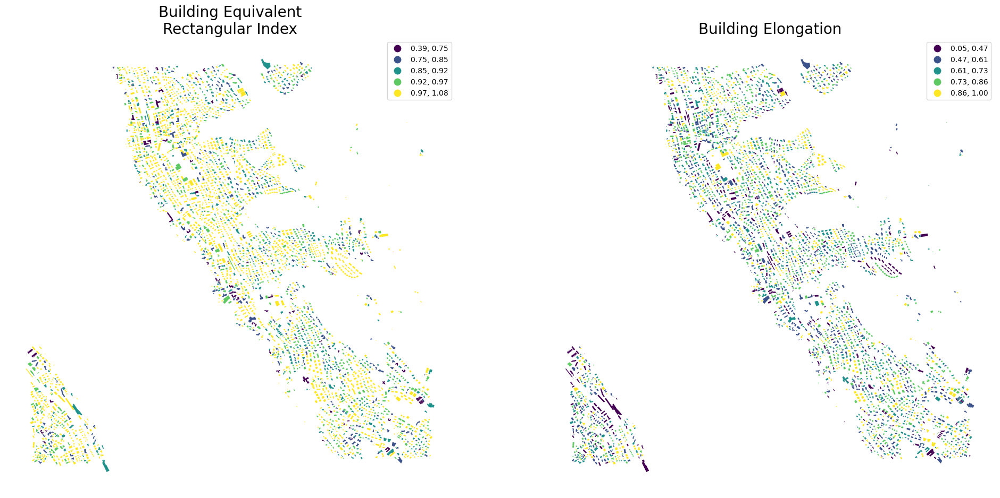

In [28]:
fig, ax = plt.subplots(1, 2, figsize=(24, 12))

buildings.plot("eri", ax=ax[0], scheme="natural_breaks", legend=True)
buildings.plot("elongation", ax=ax[1], scheme="natural_breaks", legend=True)

ax[0].set_title('Building Equivalent\nRectangular Index', fontsize=20)
ax[1].set_title('Building Elongation', fontsize=20)

ax[0].set_axis_off()
ax[1].set_axis_off()

plt.savefig('../results/Erlenbach/eri_and_elongation.pdf')  

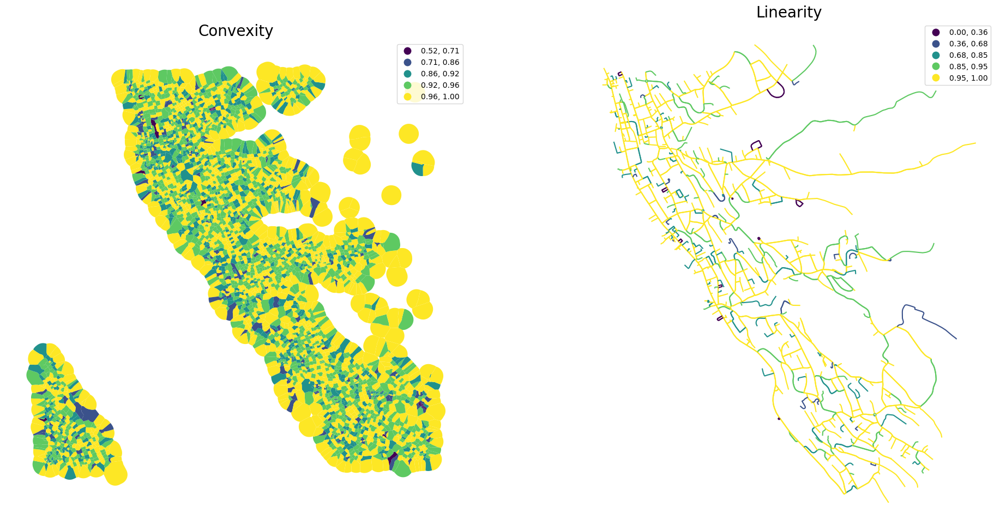

In [29]:
fig, ax = plt.subplots(1, 2, figsize=(24, 12))

tessellation.plot("convexity", ax=ax[0], scheme="natural_breaks", legend=True)
streets.plot("linearity", ax=ax[1], scheme="natural_breaks", legend=True)

ax[0].set_title('Convexity', fontsize=20)
ax[1].set_title('Linearity', fontsize=20)

ax[0].set_axis_off()
ax[1].set_axis_off()

plt.savefig('../results/Erlenbach/convexity_and_linearity.pdf')  

### Spatial distribution

In [30]:
buildings["shared_walls"] = momepy.SharedWallsRatio(buildings).series

/Users/mtwente/anaconda3/envs/maxvogt/lib/python3.11/site-packages/momepy/distribution.py:214: FutureWarning: Class based API like `momepy.SharedWalls` or `momepy.SharedWallsRatio` is deprecated. Replace it with `momepy.shared_walls` or explicitly computing `momepy.shared_walls / gdf.length` respectively to use functional API instead or pin momepy version <1.0. Class-based API will be removed in 1.0. 
  super().__init__(gdf)
/Users/mtwente/anaconda3/envs/maxvogt/lib/python3.11/site-packages/shapely/set_operations.py:133: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)


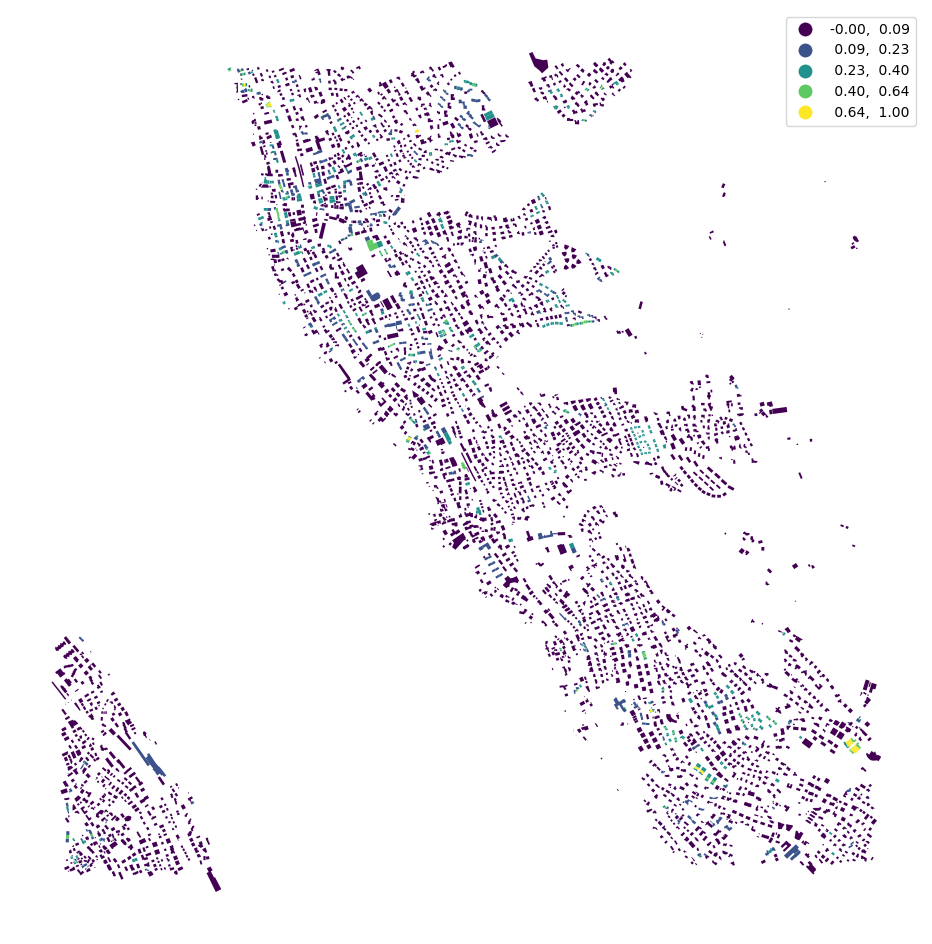

In [31]:
buildings.plot("shared_walls", figsize=(12, 12), scheme="natural_breaks", legend=True).set_axis_off()

plt.savefig('../results/Erlenbach/sharedwalls.pdf')  

Generate spatial weights matrix using `libpysal`.

In [32]:
queen_1 = libpysal.weights.contiguity.Queen.from_dataframe(tessellation, ids="uID", silence_warnings=True)

In [33]:
tessellation["neighbors"] = momepy.Neighbors(tessellation, queen_1, "uID", weighted=True, verbose=False).series
tessellation["covered_area"] = momepy.CoveredArea(tessellation, queen_1, "uID", verbose=False).series

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    
    buildings["neighbor_distance"] = momepy.NeighborDistance(buildings, queen_1, "uID", verbose=False).series

/var/folders/vs/1r1r5k5x12v5dj0w9z79tj3c0000gn/T/ipykernel_74842/1669107924.py:1: FutureWarning: Class based API like `momepy.Neighbors` is deprecated. Replace it with `momepy.neighbors` to use functional API instead or pin momepy version <1.0. Class-based API will be removed in 1.0. 
  tessellation["neighbors"] = momepy.Neighbors(tessellation, queen_1, "uID", weighted=True, verbose=False).series
/var/folders/vs/1r1r5k5x12v5dj0w9z79tj3c0000gn/T/ipykernel_74842/1669107924.py:2: FutureWarning: `momepy.CoveredArea` is deprecated. Replace it with `.describe()` method of libpysal.graph.Graph or pin momepy version <1.0. This class will be removed in 1.0. 
  tessellation["covered_area"] = momepy.CoveredArea(tessellation, queen_1, "uID", verbose=False).series


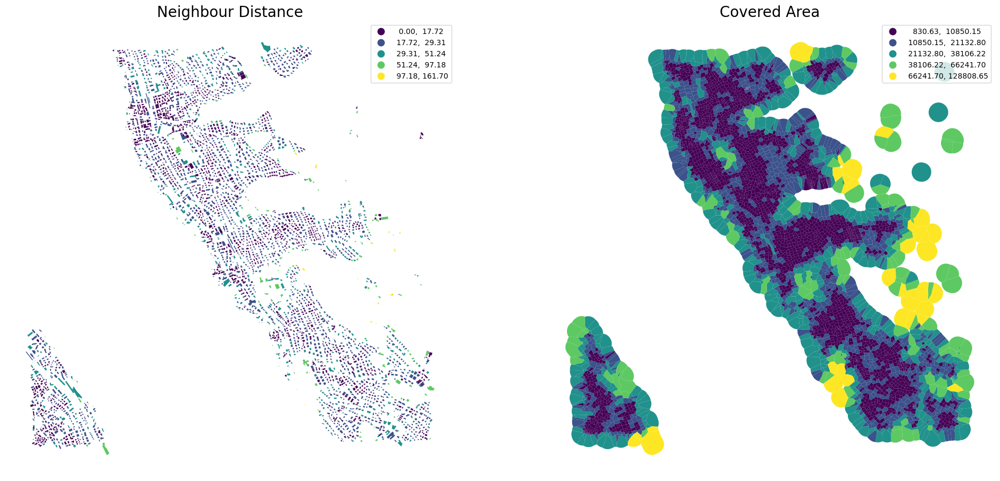

In [34]:
fig, ax = plt.subplots(1, 2, figsize=(24, 12))

buildings.plot("neighbor_distance", ax=ax[0], scheme="natural_breaks", legend=True)
tessellation.plot("covered_area", ax=ax[1], scheme="natural_breaks", legend=True)

ax[0].set_title('Neighbour Distance', fontsize=20)
ax[1].set_title('Covered Area', fontsize=20)


ax[0].set_axis_off()
ax[1].set_axis_off()

plt.savefig('../results/Erlenbach/neighbourdist_and_coveredarea.pdf')  

In [35]:
queen_3 = momepy.sw_high(k=3, weights=queen_1)
buildings_q1 = libpysal.weights.contiguity.Queen.from_dataframe(buildings, silence_warnings=True)

buildings['interbuilding_distance'] = momepy.MeanInterbuildingDistance(buildings, queen_1, 'uID', queen_3, verbose=False).series
buildings['adjacency'] = momepy.BuildingAdjacency(buildings, queen_3, 'uID', buildings_q1, verbose=False).series

/var/folders/vs/1r1r5k5x12v5dj0w9z79tj3c0000gn/T/ipykernel_74842/3221532125.py:1: FutureWarning: `momepy.sw_high` is deprecated. Replace it with .higher_order() method of libpysal.graph.Graph or pin momepy version <1.0. This class will be removed in 1.0. 
  queen_3 = momepy.sw_high(k=3, weights=queen_1)
/var/folders/vs/1r1r5k5x12v5dj0w9z79tj3c0000gn/T/ipykernel_74842/3221532125.py:2: FutureWarning: `use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning
  buildings_q1 = libpysal.weights.contiguity.Queen.from_dataframe(buildings, silence_warnings=True)
/var/folders/vs/1r1r5k5x12v5dj0w9z79tj3c0000gn/T/ipykernel_74842/3221532125.py:4: FutureWarning: Class based API like `momepy.MeanInterbuildingDistance` is deprecated. Replace it with `momepy.mean_interbuilding_distance` to use functional API instead or pin momepy version <1.0. Class-based API will be removed in 1.0. 
  buildings['interbuilding_distance'] 

In [36]:
#fig, ax = plt.subplots(1, 2, figsize=(24, 12))
#
#buildings.plot("interbuilding_distance", ax=ax[0], scheme="natural_breaks", legend=True)
#buildings.plot("adjacency", ax=ax[1], scheme="natural_breaks", legend=True)
#
#ax[0].set_axis_off()
#ax[1].set_axis_off()

In [37]:
profile = momepy.StreetProfile(streets, buildings)
streets["width"] = profile.w
streets["width_deviation"] = profile.wd
streets["openness"] = profile.o

/var/folders/vs/1r1r5k5x12v5dj0w9z79tj3c0000gn/T/ipykernel_74842/2648127835.py:1: FutureWarning: Class based API like `momepy.StreetProfile` is deprecated. Replace it with `momepy.street_profile` to use functional API instead or pin momepy version <1.0. Class-based API will be removed in 1.0. 
  profile = momepy.StreetProfile(streets, buildings)
/Users/mtwente/anaconda3/envs/maxvogt/lib/python3.11/site-packages/pandas/core/arraylike.py:492: RuntimeWarning: invalid value encountered in intersection
  return getattr(ufunc, method)(*new_inputs, **kwargs)


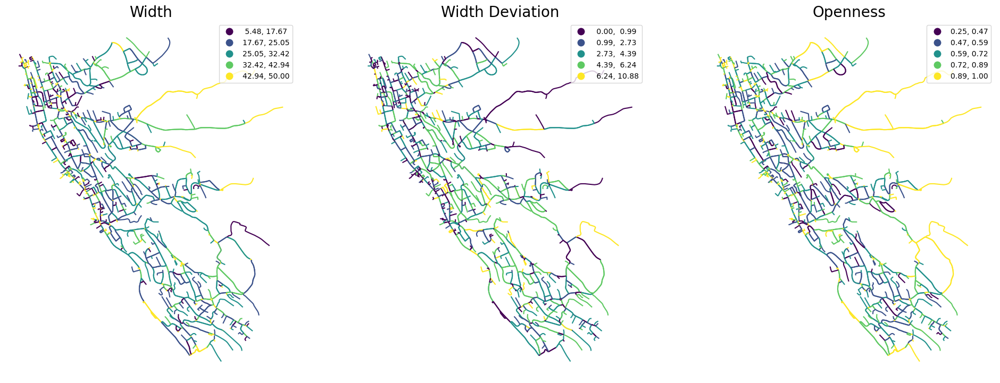

In [38]:
fig, ax = plt.subplots(1, 3, figsize=(24, 12))

streets.plot("width", ax=ax[0], scheme="natural_breaks", legend=True)
streets.plot("width_deviation", ax=ax[1], scheme="natural_breaks", legend=True)
streets.plot("openness", ax=ax[2], scheme="natural_breaks", legend=True)

ax[0].set_title('Width', fontsize=20)
ax[1].set_title('Width Deviation', fontsize=20)
ax[2].set_title('Openness', fontsize=20)

ax[0].set_axis_off()
ax[1].set_axis_off()
ax[2].set_axis_off()

plt.savefig('../results/Erlenbach/road_network.pdf')  

### Intensity

In [39]:
tessellation['car'] = momepy.AreaRatio(tessellation, buildings, 'area', 'area', 'uID').series

/var/folders/vs/1r1r5k5x12v5dj0w9z79tj3c0000gn/T/ipykernel_74842/1819725789.py:1: FutureWarning: `momepy.AreaRatio` is deprecated. Replace it with a direct division of areas or momepy.describe_agg() or pin momepy version <1.0. This class will be removed in 1.0. 
  tessellation['car'] = momepy.AreaRatio(tessellation, buildings, 'area', 'area', 'uID').series


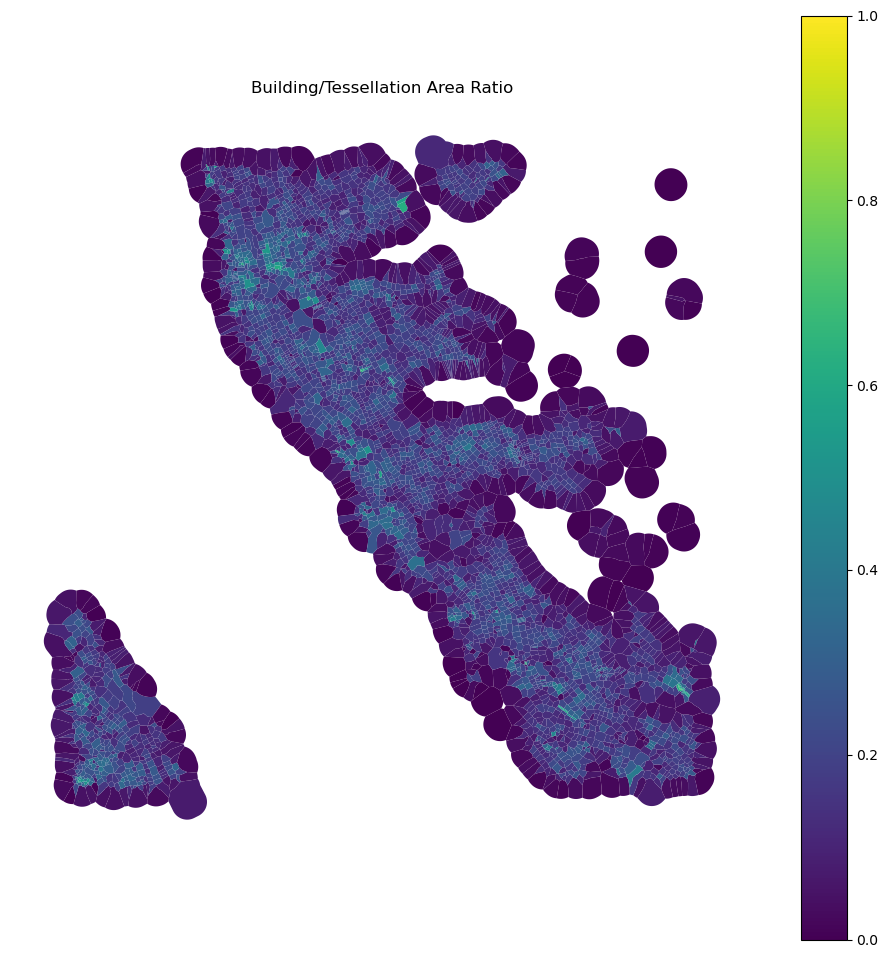

In [40]:
tessellation.plot("car", figsize=(12, 12), vmin=0, vmax=1, legend=True).set_axis_off()
plt.title("Building/Tessellation Area Ratio")

plt.savefig('../results/Erlenbach/tessellation_ratio.pdf')  

### Connectivity

In [41]:
graph = momepy.gdf_to_nx(streets)

In [42]:
graph = momepy.node_degree(graph)
graph = momepy.closeness_centrality(graph, radius=400, distance="mm_len")
graph = momepy.meshedness(graph, radius=400, distance="mm_len")

  0%|          | 0/967 [00:00<?, ?it/s]

  0%|          | 0/967 [00:00<?, ?it/s]

In [43]:
nodes, streets = momepy.nx_to_gdf(graph)

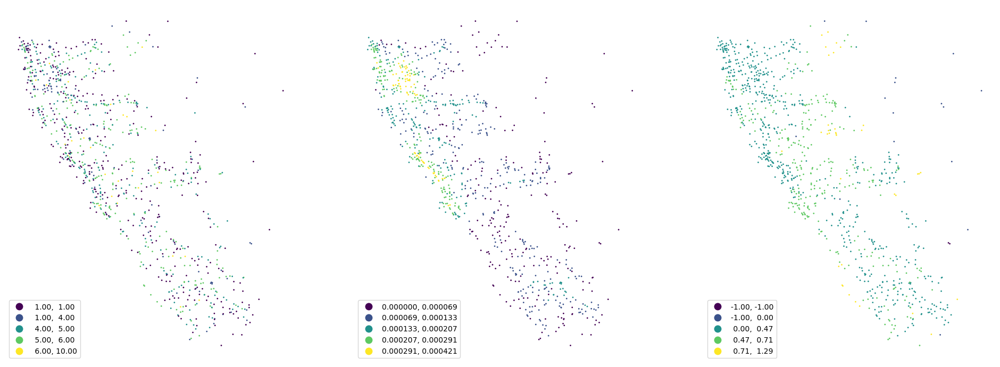

In [44]:
fig, ax = plt.subplots(1, 3, figsize=(24, 12))

nodes.plot("degree", ax=ax[0], scheme="natural_breaks", legend=True, markersize=1)
nodes.plot("closeness", ax=ax[1], scheme="natural_breaks", legend=True, markersize=1, legend_kwds={"fmt": "{:.6f}"})
nodes.plot("meshedness", ax=ax[2], scheme="natural_breaks", legend=True, markersize=1)

ax[0].set_axis_off()
ax[1].set_axis_off()
ax[2].set_axis_off()

plt.savefig('../results/Erlenbach/connectivity.pdf')  

In [45]:
buildings["nodeID"] = momepy.get_node_id(buildings, nodes, streets, "nodeID", "nID")

/var/folders/vs/1r1r5k5x12v5dj0w9z79tj3c0000gn/T/ipykernel_74842/403706460.py:1: FutureWarning: Class based API like `momepy.get_node_id` is deprecated. Replace it with `momepy.get_nearest_node` to use functional API instead or pin momepy version <1.0. Class-based API will be removed in 1.0. 
  buildings["nodeID"] = momepy.get_node_id(buildings, nodes, streets, "nodeID", "nID")


  0%|          | 0/4363 [00:00<?, ?it/s]

Link all data together (to tessellation cells or buildings).

In [46]:
tessellation

,uID,geometry,nID,area,convexity,neighbors,covered_area,car
0,3134,"POLYGON ((2688829.623 1237987.800, 2688832.637...",1791.0,19789.953804,0.943741,0.009088,37331.573639,0.078231
1,3235,"POLYGON ((2689203.090 1238093.317, 2689202.652...",1802.0,15539.551230,0.992607,0.010454,34446.760704,0.008696
2,3266,"POLYGON ((2689153.845 1238089.253, 2689153.425...",1802.0,7278.007503,0.917167,0.010546,29643.654087,0.063659
3,3237,"POLYGON ((2689112.133 1238088.000, 2689111.933...",1798.0,4647.593610,0.966758,0.012934,17485.918532,0.031800
4,3274,"POLYGON ((2689041.855 1238075.424, 2689041.818...",1798.0,4505.267563,0.987124,0.013113,16500.334713,0.028477
...,...,...,...,...,...,...,...,...
4358,1314,"POLYGON ((2687003.304 1241983.900, 2687002.273...",1597.0,770.928778,0.945052,0.042760,8532.906174,0.191557
4359,1346,"POLYGON ((2686980.837 1241988.704, 2686980.050...",1597.0,1229.455390,0.873244,0.040315,20119.461617,0.143980
4360,1319,"POLYGON ((2686950.978 1242029.662, 2686950.870...",1585.0,3264.755115,0.953183,0.014082,26006.578160,0.066619
4361,1328,"POLYGON ((2686997.021 1242040.707, 2686993.745...",1597.0,8574.958447,0.942077,0.012853,27950.589254,0.034091


In [47]:
merged = tessellation.merge(buildings.drop(columns=['nID', 'geometry']), on='uID')
merged = merged.merge(streets.drop(columns='geometry'), on='nID', how='left')
merged = merged.merge(nodes.drop(columns='geometry'), on='nodeID', how='left')

In [48]:
merged.columns

Index(['uID', 'geometry', 'nID', 'area_x', 'convexity', 'neighbors',
       'covered_area', 'car', 'area_y', 'eri', 'elongation', 'shared_walls',
       'neighbor_distance', 'interbuilding_distance', 'adjacency', 'nodeID',
       'length', 'linearity', 'width', 'width_deviation', 'openness', 'mm_len',
       'node_start', 'node_end', 'x', 'y', 'degree', 'closeness',
       'meshedness'],
      dtype='object')

## Understanding the context

Measure first, second and third quartile of distribution of values within an area around each building.

In [49]:
percentiles = []
for column in merged.columns.drop(["uID", "nodeID", "nID", 'mm_len', 'node_start', 'node_end', "geometry"]):
    perc = momepy.Percentiles(merged, column, queen_3, "uID", verbose=False).frame
    perc.columns = [f"{column}_" + str(x) for x in perc.columns]
    percentiles.append(perc)

/var/folders/vs/1r1r5k5x12v5dj0w9z79tj3c0000gn/T/ipykernel_74842/962013058.py:3: FutureWarning: Class based API like `momepy.Percentiles` is deprecated. Replace it with `momepy.percentile` to use functional API instead or pin momepy version <1.0. Class-based API will be removed in 1.0. 
  perc = momepy.Percentiles(merged, column, queen_3, "uID", verbose=False).frame
/var/folders/vs/1r1r5k5x12v5dj0w9z79tj3c0000gn/T/ipykernel_74842/962013058.py:3: FutureWarning: Class based API like `momepy.Percentiles` is deprecated. Replace it with `momepy.percentile` to use functional API instead or pin momepy version <1.0. Class-based API will be removed in 1.0. 
  perc = momepy.Percentiles(merged, column, queen_3, "uID", verbose=False).frame
/var/folders/vs/1r1r5k5x12v5dj0w9z79tj3c0000gn/T/ipykernel_74842/962013058.py:3: FutureWarning: Class based API like `momepy.Percentiles` is deprecated. Replace it with `momepy.percentile` to use functional API instead or pin momepy version <1.0. Class-based API

In [50]:
percentiles_joined = pandas.concat(percentiles, axis=1)

In [51]:
percentiles_joined

,area_x_25,area_x_50,area_x_75,convexity_25,convexity_50,convexity_75,neighbors_25,neighbors_50,neighbors_75,covered_area_25,...,y_75,degree_25,degree_50,degree_75,closeness_25,closeness_50,closeness_75,meshedness_25,meshedness_50,meshedness_75
0,1138.012395,1870.719366,4794.388658,0.942479,0.962164,0.974379,0.017494,0.032391,0.039986,12329.610123,...,1.238251e+06,1.0,1.0,4.0,0.000005,0.000006,0.000029,0.000000,0.462185,1.000000
1,912.287838,1324.257689,3631.333462,0.938405,0.955914,0.972011,0.018805,0.038831,0.049242,12551.404477,...,1.238274e+06,1.0,1.0,4.0,0.000044,0.000050,0.000064,0.268293,0.304348,0.333333
2,852.974597,1304.932154,4068.300513,0.938417,0.959628,0.970982,0.017407,0.039152,0.047123,10796.059015,...,1.238214e+06,1.0,1.0,1.0,0.000044,0.000044,0.000052,0.296296,0.333333,0.333333
3,844.796549,1138.105912,4068.300513,0.938417,0.962806,0.973349,0.018216,0.040810,0.053376,7852.309954,...,1.238168e+06,1.0,1.0,1.0,0.000005,0.000044,0.000044,0.000000,0.333333,0.333333
4,866.633922,1158.043873,3044.249730,0.949214,0.962751,0.972805,0.021715,0.040583,0.048357,9177.682742,...,1.238037e+06,1.0,1.0,1.0,0.000005,0.000006,0.000006,0.000000,0.166667,0.666667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4358,1258.199607,1661.545491,2266.896633,0.930152,0.946325,0.965933,0.029686,0.036613,0.042401,9865.651107,...,1.242028e+06,1.0,5.0,5.5,0.000075,0.000123,0.000136,0.418182,0.428571,0.431373
4359,1258.199607,1853.848992,2343.252672,0.937895,0.951443,0.967834,0.027272,0.035514,0.042401,10217.356669,...,1.242028e+06,1.0,4.5,5.0,0.000075,0.000102,0.000134,0.418182,0.428571,0.432667
4360,1279.901646,1976.668136,2781.339587,0.933947,0.945421,0.966140,0.013732,0.035277,0.042401,11056.133159,...,1.242028e+06,1.0,1.0,5.0,0.000056,0.000075,0.000123,0.418182,0.428571,0.448276
4361,1308.645863,1941.034346,2781.339587,0.930152,0.951443,0.966140,0.013732,0.034213,0.041067,10173.174499,...,1.242028e+06,1.0,1.0,5.0,0.000065,0.000088,0.000127,0.418182,0.428571,0.445068


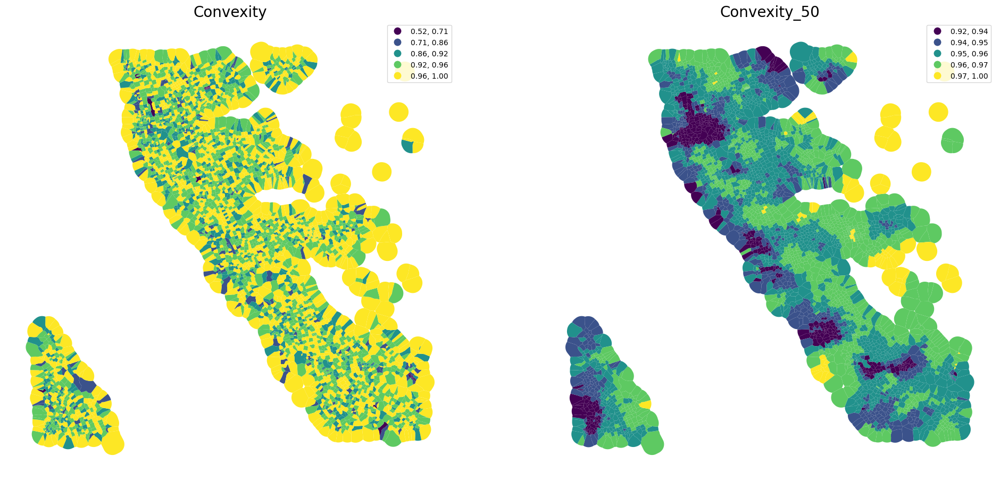

In [52]:
fig, ax = plt.subplots(1, 2, figsize=(24, 12))

tessellation.plot("convexity", ax=ax[0], scheme="natural_breaks", legend=True)
merged.plot(percentiles_joined['convexity_50'].values, ax=ax[1], scheme="natural_breaks", legend=True)

ax[0].set_title('Convexity', fontsize=20)
ax[1].set_title('Convexity_50', fontsize=20)

ax[0].set_axis_off()
ax[1].set_axis_off()

plt.savefig('../results/Erlenbach/convexity.pdf')  

## Clustering

Standardize values before clustering.

In [53]:
standardized = (percentiles_joined - percentiles_joined.mean()) / percentiles_joined.std()

In [54]:
standardized

,area_x_25,area_x_50,area_x_75,convexity_25,convexity_50,convexity_75,neighbors_25,neighbors_50,neighbors_75,covered_area_25,...,y_75,degree_25,degree_50,degree_75,closeness_25,closeness_50,closeness_75,meshedness_25,meshedness_50,meshedness_75
0,0.157751,0.304221,1.187585,0.862473,0.870777,0.303628,-1.825162,-1.155740,-1.059137,0.874604,...,-1.836746,-0.977,-2.968876,-1.968592,-1.471781,-1.639327,-1.475981,-3.966363,-0.078288,4.109512
1,-0.025760,-0.052042,0.640771,0.609642,0.190264,-0.093325,-1.675229,-0.361398,-0.052160,0.922370,...,-1.816922,-0.977,-2.968876,-1.968592,-0.818382,-1.011104,-1.027846,-1.488803,-1.557979,-1.524357
2,-0.073981,-0.064641,0.846213,0.610381,0.594625,-0.265926,-1.835181,-0.321829,-0.282702,0.544334,...,-1.869982,-0.977,-2.968876,-5.392496,-0.818382,-1.086965,-1.182698,-1.230203,-1.286246,-1.524357
3,-0.080629,-0.173402,0.846213,0.610381,0.940615,0.130870,-1.742562,-0.117307,0.397582,-0.089641,...,-1.910532,-0.977,-2.968876,-5.392496,-1.471781,-1.086965,-1.281266,-3.966363,-1.286246,-1.524357
4,-0.062876,-0.160404,0.364752,1.280374,0.934586,0.039748,-1.342325,-0.145327,-0.148436,0.195795,...,-2.027066,-0.977,-2.968876,-5.392496,-1.471781,-1.643678,-1.773867,-3.966363,-2.848713,1.292578
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4358,0.255461,0.167851,-0.000723,0.097490,-0.853641,-1.112512,-0.430429,-0.634927,-0.796447,0.343958,...,1.518616,-0.977,0.107566,-0.256640,-0.310440,0.046045,-0.114111,-0.104646,-0.393407,-0.695846
4359,0.255461,0.293223,0.035176,0.577998,-0.296476,-0.793689,-0.706585,-0.770514,-0.796447,0.419703,...,1.518616,-0.977,-0.276989,-0.827291,-0.310440,-0.264948,-0.137974,-0.104646,-0.393407,-0.684904
4360,0.273104,0.373294,0.241144,0.333010,-0.952107,-1.077856,-2.255579,-0.799804,-0.796447,0.600344,...,1.518616,-0.977,-2.968876,-0.827291,-0.619077,-0.650804,-0.270839,-0.104646,-0.393407,-0.553000
4361,0.296473,0.350063,0.241144,0.097490,-0.296476,-1.077856,-2.255579,-0.930974,-0.941474,0.410187,...,1.518616,-0.977,-2.968876,-0.827291,-0.466483,-0.457402,-0.224959,-0.104646,-0.393407,-0.580107


### How many clusters?

In [55]:
cgram = Clustergram(range(1, 12), n_init=10, random_state=0)
cgram.fit(standardized.fillna(0))

K=1 skipped. Mean computed from data directly.
K=2 fitted in 0.066 seconds.
K=3 fitted in 0.056 seconds.
K=4 fitted in 0.065 seconds.
K=5 fitted in 0.097 seconds.
K=6 fitted in 0.093 seconds.
K=7 fitted in 0.111 seconds.
K=8 fitted in 0.096 seconds.
K=9 fitted in 0.120 seconds.
K=10 fitted in 0.157 seconds.
K=11 fitted in 0.141 seconds.


Clustergram(k_range=range(1, 12), backend='sklearn', method='kmeans', kwargs={'n_init': 10, 'random_state': 0})

In [56]:
show(cgram.bokeh())

In [57]:
cgram.labels.head()

,1,2,3,4,5,6,7,8,9,10,11
0,0,0,2,0,3,1,0,1,0,7,10
1,0,0,2,0,3,1,0,6,0,7,10
2,0,0,2,0,3,1,0,6,0,7,10
3,0,0,2,0,3,1,0,6,0,7,10
4,0,0,2,0,3,1,0,1,0,7,10


In [58]:
merged["cluster"] = cgram.labels[8].values

In [59]:
urban_types = buildings[["geometry", "uID"]].merge(merged[["uID", "cluster"]], on="uID")

In [60]:
urban_types.explore("cluster", categorical=True, prefer_canvas=True, tiles="CartoDB Positron", tooltip=False)

## Export

Save cluster output geodata to geojson file:

In [61]:
urban_types.to_file('../data/raw/Erlenbach.geojson', driver='GeoJSON')

## Utilities

Once you run the cell below, it hides all cells below the currently active one (aka presentation mode).

In [62]:
%%html
<style>
.jp-Cell.jp-mod-selected ~ .jp-Cell {
    display: none;
}
</style>

Run this cell to turn the presentation mode off.

In [63]:
%%html
<style>
.jp-Cell.jp-mod-selected ~ .jp-Cell {
    display: block;
}
</style>